In [1]:
import numpy as np
import scipy as sp
import torch as th

import os, pdb, sys, json, glob, tqdm
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style('whitegrid')

sns.set_context('notebook')

%matplotlib inline
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['figure.dpi'] = 200
sns.set(context='poster',
        style='ticks',
        font_scale=1,
        rc={'axes.grid':True,
            'grid.color':'.9',
            'grid.linewidth':0.75})
%load_ext autoreload
%autoreload 2

dev = 'cuda'
root = '/home/ubuntu/ext_vol'
import sys
sys.path.insert(0, f'{root}/inpca')

from utils import get_data, get_idx, triplot, plotly_3d

In [2]:
import plotly.graph_objects as go
import numpy as np
import plotly.offline as pyo
import pandas as pd
pyo.init_notebook_mode()

#### Train with Geod (included in embedding)

In [178]:
r = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/r_yh_all_geod.p")
didx = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_geod_all.p").reset_index(drop=True)
didx = didx.drop('index', axis=1)

In [179]:
for (config, ii) in didx.groupby(['seed', 'm', 'opt', 'bs', 'aug', 'lr', 'wd']).indices.items():
    if config[1] == 'geodesic':
        continue
    tmax = didx.iloc[ii]['t'].max()
    didx.loc[ii, 'nepochs'] = didx.loc[ii, 't'] * didx.loc[ii, 'bs'].astype(float) / 50000

In [180]:
import h5py
f = h5py.File("/home/ubuntu/ext_vol/inpca/inpca_results_all/w_yh_all_geod.h5", "r")
w = f["w"]
d2truth = w[-1, :]
d2truth[d2truth > 2] = 2
d2init = w[-100, :]
didx['d2truth'] = d2truth
didx['d2init'] = d2init

In [181]:
d_out = didx.iloc[(d2truth >= 2)].reset_index(drop=True)
# d_out = d_out[d_out.nepochs <= 5].reset_index(drop=True)

In [182]:
len(get_idx(d_out, "nepochs <= 5 & bs>200"))

469

In [183]:
cols =  ['nepochs', 'opt']
c = d_out.groupby(cols).count()[['seed']]
c = c.reset_index()

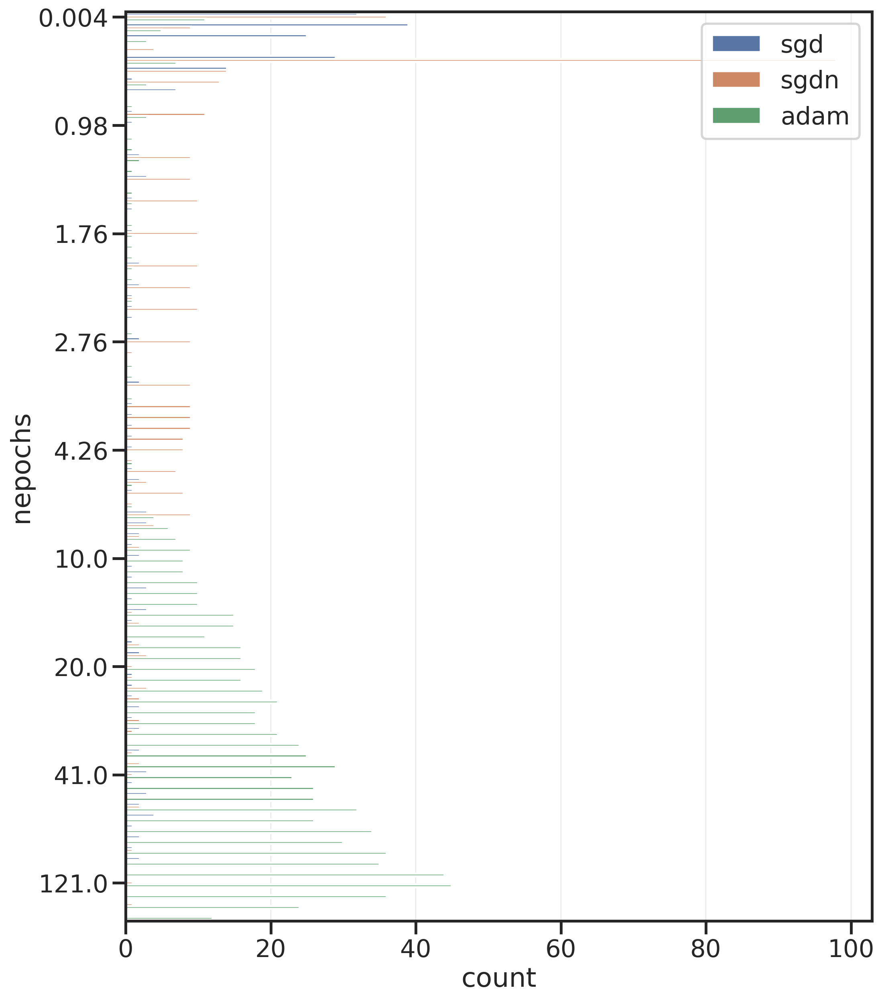

In [192]:
plt.figure(figsize=(12, 15))
ax = sns.countplot(data=d_out, y='nepochs', hue='opt')
ax.legend(loc='upper right')
new_ticks = [i.get_text() for i in ax.get_yticklabels()]
ticks = ax.set_yticks(range(0, len(new_ticks), 10), new_ticks[::10])

In [ ]:
from matplotlib.lines import Line2D    
def build_legend(data):
    """
    Build a legend for matplotlib plt from dict
    """
    legend_elements = []
    for key in data:
        legend_elements.append(Line2D([0], [0], marker='o', color='w', label=key,
                                        markerfacecolor=data[key], markersize=10))
    return legend_elements

fig,ax = plt.subplots(1)
ax.axis('off')
legend_elements = build_legend({'allcnn': '#e41a1c', 'convmixer': '#377eb8', 'fc': '#4daf4a', 'vit': '#984ea3', 'wr-10-4-8': '#ff7f00', 'wr-16-4-64': '#ffff33', 'geodesic': '#a65628'})
ax.legend(handles=legend_elements, loc='upper left')
fig.savefig('plots/legends.pdf')  

In [116]:
idxs = get_idx(didx, "opt != 'adam'")
didx = didx.iloc[idxs].reset_index(drop=True)
r['xp'] = r['xp'][idxs, :]

In [67]:
r['xp'][:, 0].min()

-1.5348299

In [ ]:
# from plot import plotly_3d
emph = list(didx[didx.m=='geodesic'].index)
cmap = {f"m: {c}": i for (i, c) in enumerate(didx.m.unique())} 
fig = plotly_3d(dc=didx.reset_index(drop=True), r=r, 
#                 avg=np.arange(len(didx))[:-100],
                    emph={'geodesic':emph, 'p0':emph[:1], 'p*':emph[-1:]},
                    empsize={'geodesic':6, 'p0':8, 'p*':8}, 
                    empcolor={'geodesic':'black', 'p0':'red', 'p*':'red'},
                    opacity=0.25,
                    colorscale='Set1',
                    ne=5, 
                    color='m',
                    cols = ['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd'],
                    xrange=[-1, 1],
                    yrange=[-0.75, 1.25],
                    zrange=[-0.75, 0.5]
#                  xrange=[-2, 3],
#                     yrange=[-0.75, 7],
#                     zrange=[-2, 3]
               )
# fig.add_trace(go.Surface(x=x, y=y, z=z, opacity=0.5))
camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=0, y=-0.15, z=-0.2),
    eye=dict(x=2.55, y=2.55, z=2.55)
)
fig.update_layout(scene_camera=camera)
fig.show()

In [16]:
# fig.write_image("plots/all_models_train_3d.pdf")
fig.write_html("plots/all_models_train_3d.html")

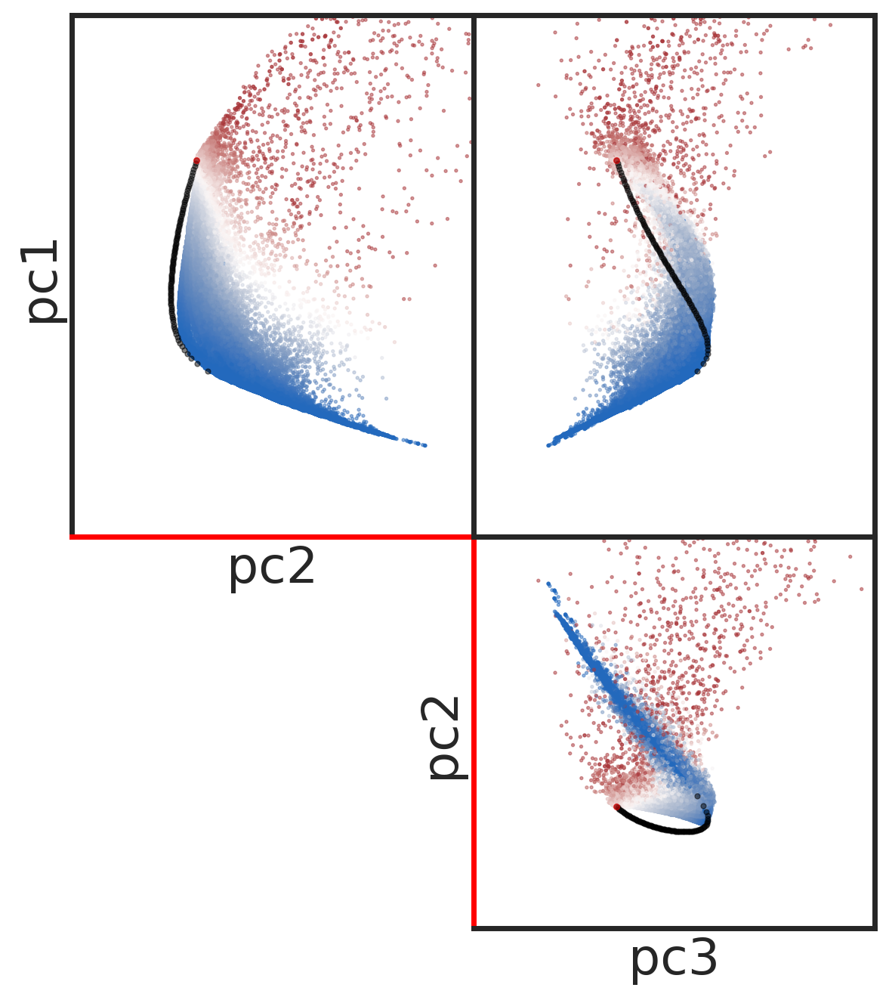

In [84]:
emph = list(didx[didx.m=='geodesic'].index)
f, gs = triplot(didx.reset_index(drop=True), r, emph={'geodesic':emph, 'p0':emph[:1], 'p*':emph[-1:]},
                    empsize={'geodesic':6, 'p0':8, 'p*':8}, 
                    empcolor={'geodesic':'black', 'p0':'red', 'p*':'red'},
                     ckey='d2truth', colorscale='vlag',
                grid_ratio=[4,3,3], grid_size=0.3,
                centers=[0,0.25,0])

In [31]:
f.savefig('plots/all_models_train_2d_5dims.pdf')  

#### Test with Geod (included in embedding)

In [113]:
from utils import dinpca
import h5py

In [147]:
r = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/r_yvh_all_geod.p")
didx = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_geod_all.p").reset_index(drop=True)
didx = didx.drop('index', axis=1)

In [148]:
ii = get_idx(didx, "verr > 0.4 & verr < 0.45 & aug=='none'")

In [149]:
f = h5py.File("/home/ubuntu/ext_vol/inpca/inpca_results_all/w_yvh_all_geod.h5", "r")
w = f["w"]

In [151]:
wi = w[ii, :][:, ii]

In [152]:
di = didx.iloc[ii].reset_index(drop=True)

In [153]:
idxs=di.groupby(['m']).indices

In [96]:
d2truth = w[-1, :]
d2init = w[-100, :]
d2truth[d2truth>2]=2
didx['d2truth'] = d2truth
didx['d2init'] = d2init

In [67]:
didx = didx[~(d2truth>2)[:-100]].reset_index(drop=True)
r['xp'] = r['xp'][~(d2truth>2)[:-100], :]

In [110]:
xx = th.Tensor(r['xp'])[:, :3]
truth = th.Tensor(r['xp'][-1:, :3])
d = dinpca(xx, truth, sign=th.Tensor(np.sign(r['e'][:3]))).cpu()
didx['inpcad2truth'] = th.clamp(d[0], -1, 1)

In [11]:
w0 = w[idxs, :][:, idxs]

In [125]:
idx = th.randperm(len(didx))[:5000]
for (config, ii) in didx.groupby(['seed', 'm', 'opt', 'bs', 'aug', 'lr', 'wd']).indices.items():
    tmax = didx.iloc[ii]['t'].max()
    didx.loc[ii, 't'] /= tmax
# didx = didx.iloc[idx].reset_index(drop=True)
# r['xp'] = r['xp'][idx, :]

In [ ]:
emph = list(didx[didx.m=='geodesic'].index)
cmap = {f"m: {c}": i for (i, c) in enumerate(didx.m.unique())} 
fig = plotly_3d(dc=didx.reset_index(drop=True), r=r, 
                    emph={'geodesic':emph, 'p0':emph[:1], 'p*':emph[-1:]},
                    empsize={'geodesic':4, 'p0':8, 'p*':8}, 
                    empcolor={'geodesic':'black', 'p0':'red', 'p*':'red'},
                    opacity=0.25,
                    colorscale='RdBu',
                    ne=5, 
                    size=2,
                    color='verr',
                    cols = ['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd'],
                    xrange=[-1, 1],
                    yrange=[-1, 0.5],
                    zrange=[-0.75, 0.75]
#                     xrange=[-2, 3],
#                     yrange=[-7, 1],
#                     zrange=[-2, 2]
               )
# fig.add_trace(go.Surface(x=x, y=y, z=z, opacity=0.5))
camera = dict(
    up=dict(x=-0.05, y=0.2, z=1),
    center=dict(x=0.15, y=0.2, z=-0.25),
    eye=dict(x=-1.05, y=-1.25, z=1.25)
)
fig.update_layout(scene_camera=camera)
fig.show()

In [16]:
# fig.write_image("plots/all_models_val_3d.pdf")
fig.write_html("plots/all_models_val_3d.html")

In [43]:
idxs = []
for (config, ii) in didx.groupby(['seed', 'm', 'opt', 'bs', 'aug', 'lr', 'wd']).indices.items():
    tmax = didx.iloc[ii]['t'].max()
    didx.loc[ii, 't'] /= tmax
    if didx.iloc[ii[-1]]['err'] < 0.1:
        idxs.extend(ii)
# dd = didx.iloc[idxs].reset_index(drop=True)
# r['xp'] = r['xp'][idxs, :]

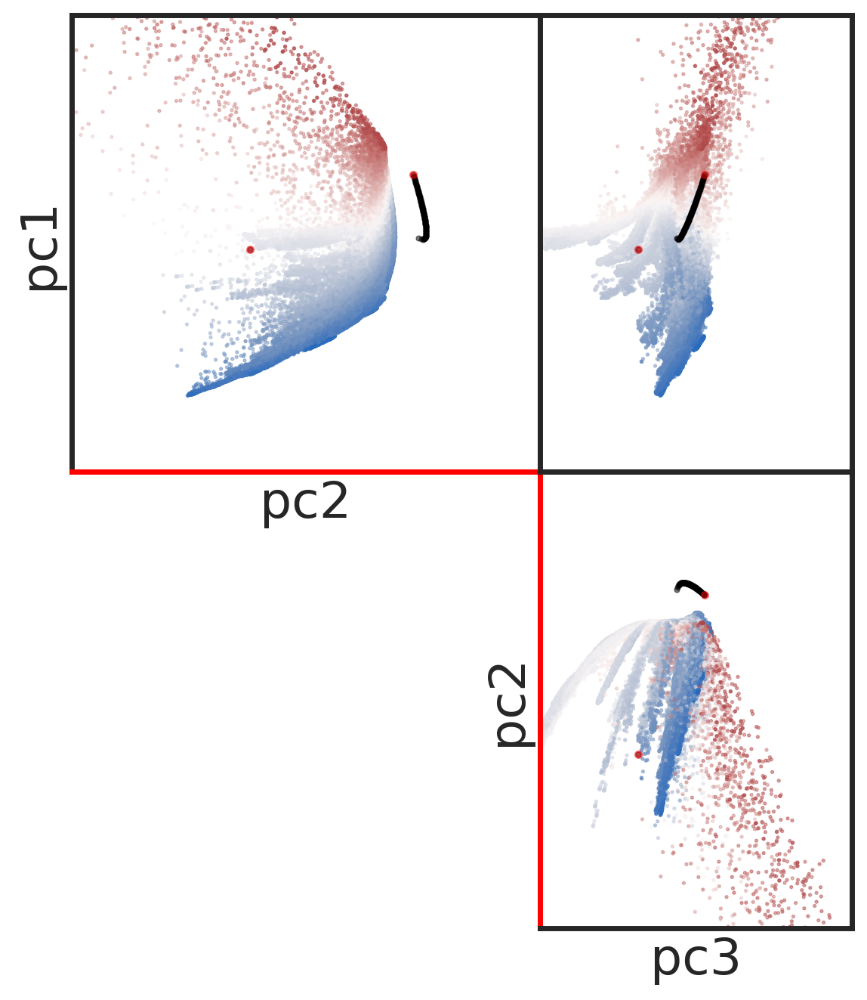

In [119]:
emph = list(didx[didx.m=='geodesic'].index)
f, gs = triplot(didx.reset_index(drop=True), r, emph={'geodesic':emph, 'p0':emph[:1], 'p*':emph[-1:]},
                    empsize={'geodesic':6, 'p0':12, 'p*':12}, 
                    empcolor={'geodesic':'black', 'p0':'red', 'p*':'red'}, d=3, 
                ckey='verr', colorscale='vlag',
                grid_ratio=[6,6,4], grid_size=0.2, centers=[0, -0.3, 0.1])

In [38]:
f.savefig('plots/all_models_val_2d_5dims.pdf')  

### Reindexed Models

In [225]:
r = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_avg_new/r_yh_all.p")
didx = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_avg_new/didx_all.p").reset_index(drop=True)

In [221]:
import h5py
f = h5py.File('/home/ubuntu/ext_vol/inpca/inpca_results_avg_new/w_yh_all.h5', 'r')
w = f['w']

In [224]:
didx.m.unique()

array(['allcnn', 'convmixer', 'fc', 'vit', 'wr-10-4-8', 'wr-16-4-64'],
      dtype=object)

In [222]:
w.shape

(58500, 58500)

In [ ]:
from embed import proj_
l = np.eye(w.shape[0]) - 1.0/w.shape[0]
w = -l @ w @ l / 2
r = proj_(w, w.shape[0], 3)

In [195]:
r = th.load('/home/ubuntu/ext_vol/inpca/inpca_results_avg_new/r_yh_all.h5')

In [ ]:
th.save(r, '/home/ubuntu/ext_vol/inpca/inpca_results_avg_new/r_yh_all.p')

In [ ]:
fig = plotly_3d(dc=didx.reset_index(drop=True), r=r, 
                    opacity=0.25,
                    colorscale='Set1',
                    ne=5, return_d=True,
                    color='m',mode='markers', 
                    xrange=[-0.75, 0.75],
                    yrange=[-0.75, 0.75],
                    zrange=[-0.75, 0.75])
# fig.add_trace(go.Surface(x=x, y=y, z=z, opacity=0.5))
camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=-0.2, y=0, z=0),
    eye=dict(x=2.55, y=2.65, z=2.85)
)
fig.update_layout(scene_camera=camera)
fig.show()

In [102]:
fig.write_image("plots/interpolated_models_3d.pdf")

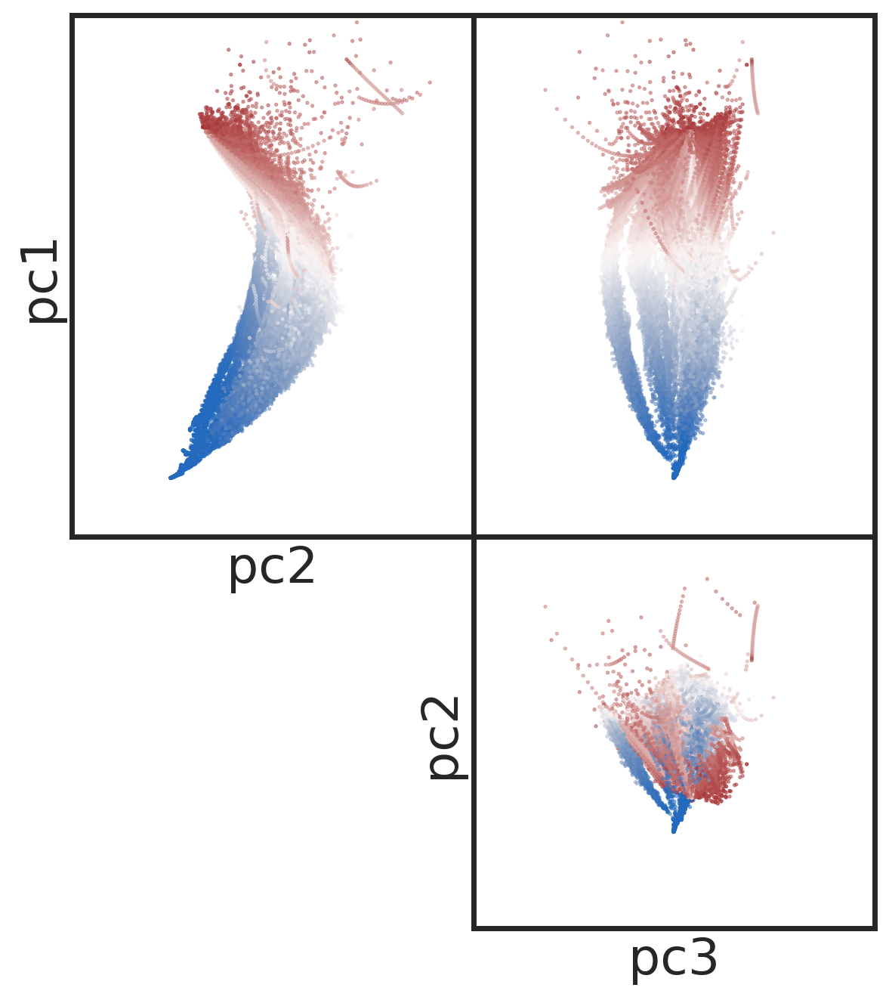

In [226]:
f, gs = triplot(didx.reset_index(drop=True), r, d=3, colorscale='vlag', ckey='err',grid_ratio=[4,3,3], grid_size=0.2)

In [104]:
f.savefig('plots/interpolated_2d.pdf')  

### Explained Variance

In [61]:
df = pd.DataFrame()
for key in ['yh', 'yvh']:
    r = th.load(f"/home/ubuntu/ext_vol/inpca/inpca_results_all/r_{key}_all.p")
    ii = np.argsort(np.abs(r['es']))[::-1]
    es = r['es'][ii][:50]
    dset = 'train' if key == 'yh' else 'test'
    df_ = pd.DataFrame({'eigenvalue index':np.arange(len(es)), 'explained variance':1 - np.sqrt(1-np.cumsum(es ** 2)/r['fn']**2), 
                       'data':dset})
    df = pd.concat([df, df_]).reset_index(drop=True)

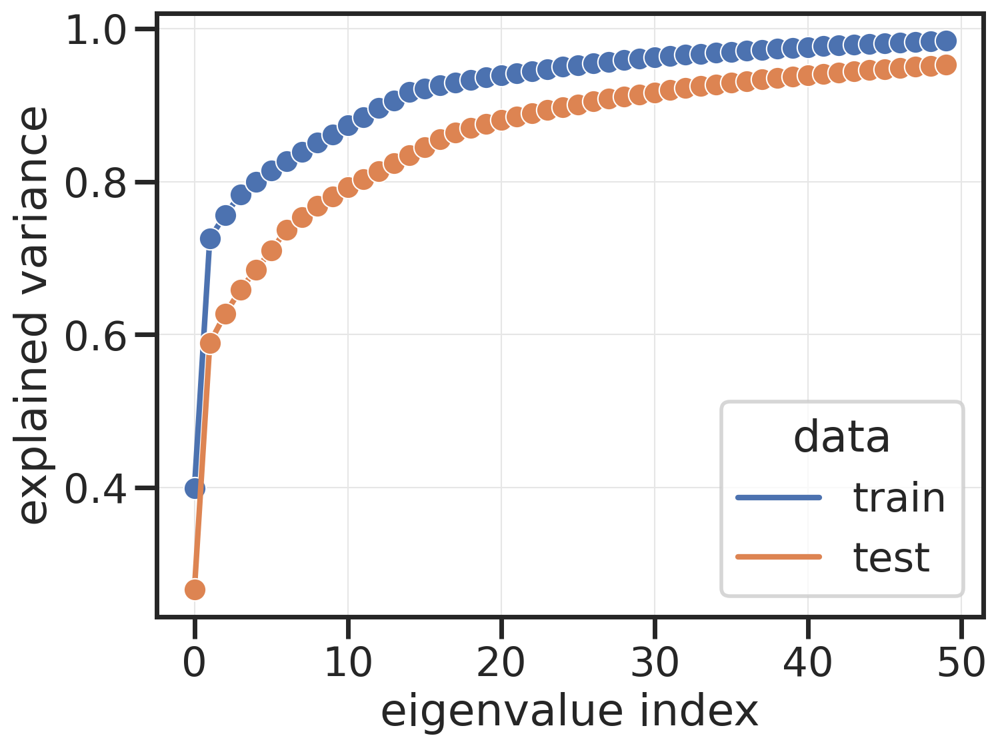

In [69]:
# es = r['es']

f=plt.figure(figsize=(8,6))
g=sns.lineplot(data=df, x='eigenvalue index', y='explained variance', hue='data', marker="o")

In [70]:
f.savefig('plots/explained_var.pdf')

#### Same models in original space

In [208]:
r = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/r_yh_interp_subset.p")
didx = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_yh_all.p").reset_index(drop=True)

In [209]:
idxs = get_idx(didx, "aug=='none' & seed <=46")
dd = didx.iloc[idxs].reset_index(drop=True)

In [8]:
import h5py
from embed import proj_
f = h5py.File('/home/ubuntu/ext_vol/inpca/inpca_results_all/w_yh_all.h5', 'r')
w = f['w']
wi = w[idxs,:][:, idxs]
l = np.eye(wi.shape[0]) - 1.0/wi.shape[0]
wi = -l @ wi @ l / 2
r = proj_(wi, wi.shape[0], 3)

Projecting


In [9]:
th.save(r, "/home/ubuntu/ext_vol/inpca/inpca_results_all/r_yh_interp_subset.p")

In [210]:
idxs = []
for (config, ii) in dd.groupby(['seed', 'm', 'opt', 'bs', 'aug', 'lr', 'wd']).indices.items():
    tmax = dd.iloc[ii]['t'].max()
    dd.loc[ii, 't'] /= tmax

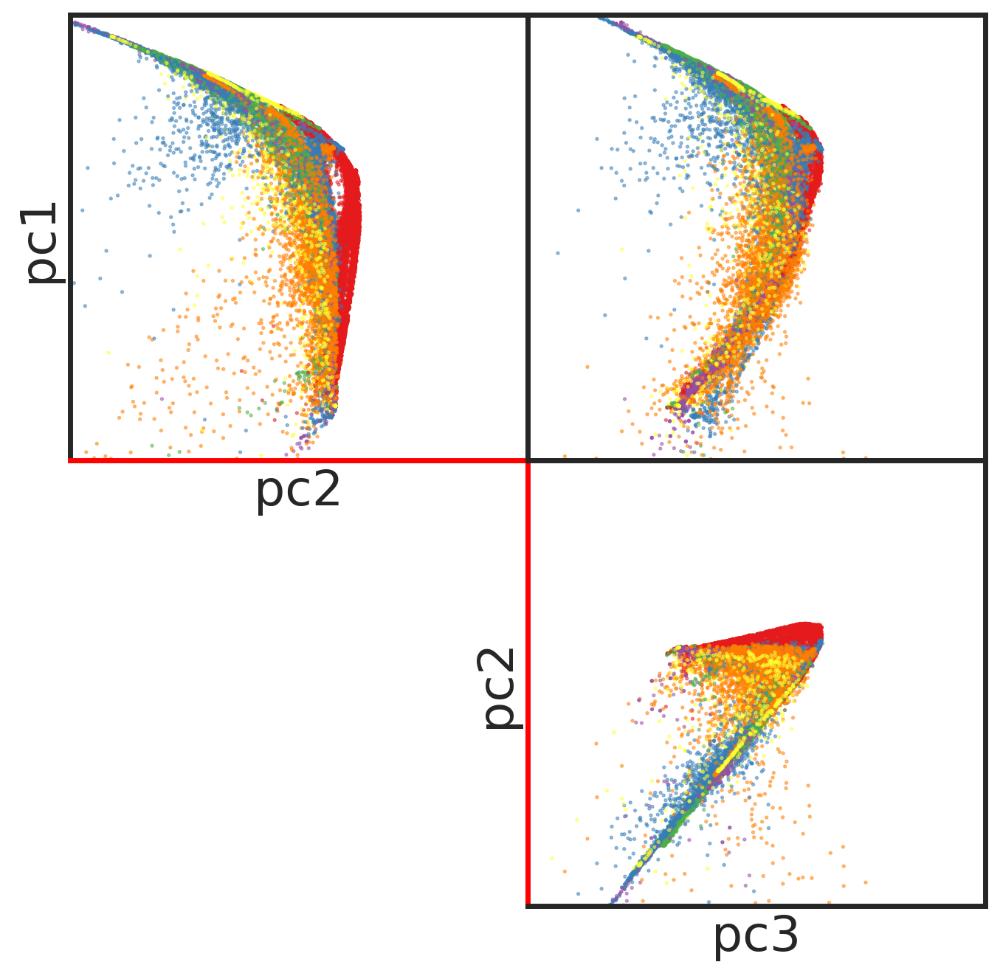

(<Figure size 1600x1600 with 3 Axes>, GridSpec(2, 2))

In [216]:
emph = get_idx(dd, "m=='geodesic'")
triplot(dd.reset_index(drop=True), r, d=3, colorscale='Set1', ckey='m',grid_ratio=[3,3,3], grid_size=0.25)

### Mixed

In [49]:
didx = th.load('/home/ubuntu/ext_vol/inpca/inpca_results_mixed/didx_yh_subset.p')
r = th.load('/home/ubuntu/ext_vol/inpca/inpca_results_mixed/r_yh_subset.p')

In [50]:
didx = pd.concat([didx['dr'], didx['dc']]).reset_index(drop=True)

In [51]:
idxs = []
for (config, ii) in didx.groupby(['seed', 'm', 'opt', 'bs', 'aug', 'lr', 'wd']).indices.items():
    tmax = didx.iloc[ii]['t'].max()
    didx.loc[ii, 't'] /= tmax

In [52]:
didx['interp'] = '1'
didx['interp'].iloc[:7678] = '0'

/tmp/ipykernel_24387/3310446404.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



{'0': 0, '1': 1}


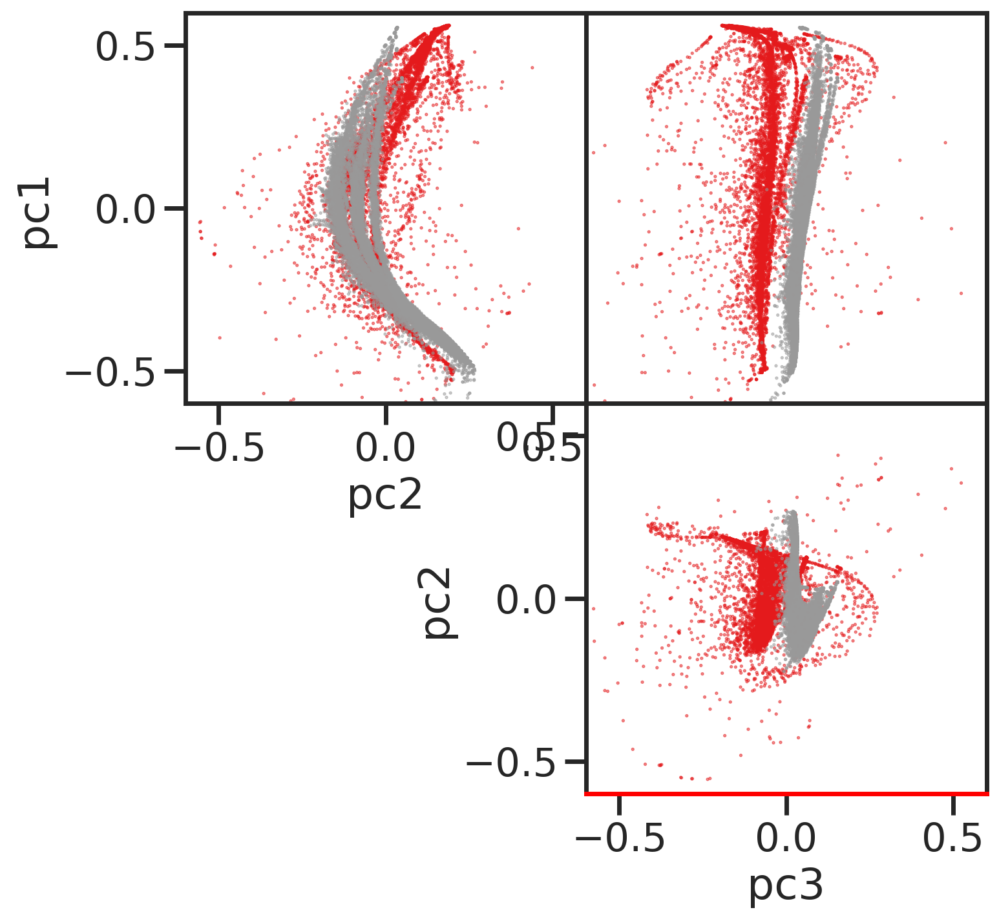

In [53]:
f, gs = triplot(didx.reset_index(drop=True), r, d=3, cmap='Set1', ckey='interp',grid_ratio=[3,3,3], grid_size=0.2)

In [ ]:
# emph = list(didx[didx.interp==True].index)
fig = plotly_3d(dc=didx.reset_index(drop=True), r=r, 
                    opacity=0.25,
                    colorscale='Set1',
                    ne=5, return_d=True,
                    color='interp',mode='markers', 
                    xrange=[-0.75, 0.75],
                    yrange=[-0.75, 0.75],
                    zrange=[-0.75, 0.75])
# fig.add_trace(go.Surface(x=x, y=y, z=z, opacity=0.5))
camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=-0.2, y=0, z=0),
    eye=dict(x=2.55, y=2.65, z=2.85)
)
fig.update_layout(scene_camera=camera)
fig.show()

In [ ]:
th.save(r, '/home/ubuntu/ext_vol/inpca/inpca_results_mixed/r_yh_subset.p')

In [37]:
w = th.load('/home/ubuntu/ext_vol/inpca/inpca_results_mixed/w_yh_(42, False)_(42, True).p')

In [ ]:
import h5py
from embed import proj_
w1 = h5py.File('/home/ubuntu/ext_vol/inpca/inpca_results_all/w_yh_all.h5', 'r')['w']
w1 = w1[idxs,:][:, idxs]

In [ ]:
w2 = h5py.File('/home/ubuntu/ext_vol/inpca/inpca_results_avg_new/w_yh_all.h5', 'r')['w']

### MDS

In [94]:
r = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/r_yh_euclid.p")
didx = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_geod_all.p").reset_index(drop=True)
idxs = get_idx(didx, "(m=='allcnn' and aug == 'simple' and wd==0.0) or m=='geodesic'")
didx = didx.iloc[idxs].reset_index(drop=True)
r['xp'] = r['xp']

In [97]:

fig = plotly_3d(dc=didx.reset_index(drop=True), r=r, 
                    opacity=0.25,
                    colorscale='rdbu',
                    ne=5, 
                    color='t',
                    xrange=[-1, 0.75],
                    yrange=[-0.75, 0.75],
                    zrange=[-0.75, 0.75])
camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=-0.2, y=0, z=0),
    eye=dict(x=2.55, y=2.65, z=2.85)
)
fig.update_layout(scene_camera=camera)
fig.show()

[ 6.45326427e+02  1.21767757e+02  5.03492279e+01  2.26691389e+01
 -1.24232642e-05 -3.34984928e-11 -1.47018865e-11 -8.55184476e-12
 -8.29198384e-12]


In [12]:
from sklearn.manifold import MDS
mds = MDS(n_components=3, metric=True, dissimilarity='precomputed')

In [119]:
import h5py
f = h5py.File(f'/home/ubuntu/ext_vol/inpca/inpca_results_all/w_yh_all_geod.h5', 'r')
w = f['w']

In [16]:
X_transformed = mds.fit_transform(w[idxs,:][:, idxs])
th.save(X_transformed, "mds_allcnn.p")

In [98]:
r = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/r_yh_all_geod.p")
didx = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_geod_all.p").reset_index(drop=True)
idxs = get_idx(didx, "(m=='allcnn' and aug == 'simple' and wd==0.0) or m=='geodesic'")
didx = didx.iloc[idxs].reset_index(drop=True)
r['xp'] = r['xp'][idxs]
X_transformed = th.load('mds_allcnn.p')
r['xp'] = X_transformed

In [100]:
emph = [list(didx[didx.m=='geodesic'].index)]

fig = plotly_3d(dc=didx.reset_index(drop=True), r=r, 
                    opacity=0.25,
                    colorscale='rdbu',
                    ne=3, 
                    color='t', 
                    xrange=[-1, 0.75],
                    yrange=[-0.75, 0.75],
                    zrange=[-0.75, 0.75])
camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=-0.2, y=0, z=0),
    eye=dict(x=2.55, y=2.65, z=2.85)
)

fig.update_layout(scene_camera=camera)
fig.show()

[ 19277.227  -12896.538    3052.2385  -2690.4983   1997.9574   1829.812
   1595.701 ]


In [ ]:
wi = w[idxs,:][:, idxs]
l = np.eye(wi.shape[0]) - 1.0/wi.shape[0]
wi = -l @ wi @ l / 2

In [23]:
from embed import proj_
r = proj_(wi, wi.shape[0], 3)

Projecting


In [24]:
emph = [list(didx[didx.m=='geodesic'].index)]
fig = plotly_3d(dc=didx.reset_index(drop=True), r=r, 
                    opacity=0.25,
                    colorscale='rdbu',
                    ne=3, return_d=True,
                    color='t',mode='markers', 
                    xrange=[-1, 0.75],
                    yrange=[-0.75, 0.75],
                    zrange=[-0.75, 0.75])
camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=-0.2, y=0, z=0),
    eye=dict(x=2.55, y=2.65, z=2.85)
)
fig.update_layout(scene_camera=camera)
fig.show()

[ 6.46720561e+02  6.08376777e+01  1.76908435e+01  1.12973983e+01
 -1.00010076e+01 -7.78686051e+00 -9.41723061e-01 -5.52736319e-01
 -3.64253441e-01]
